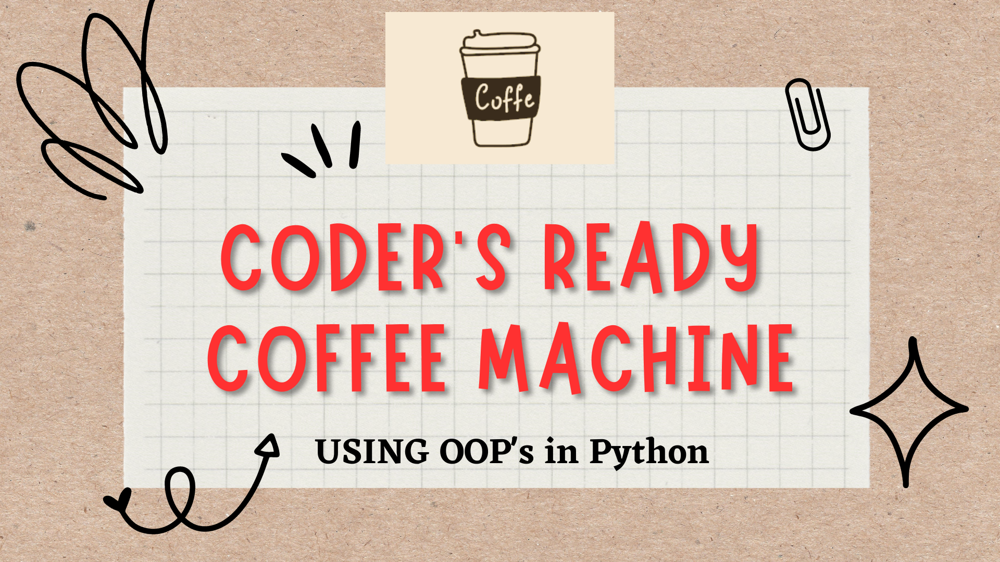

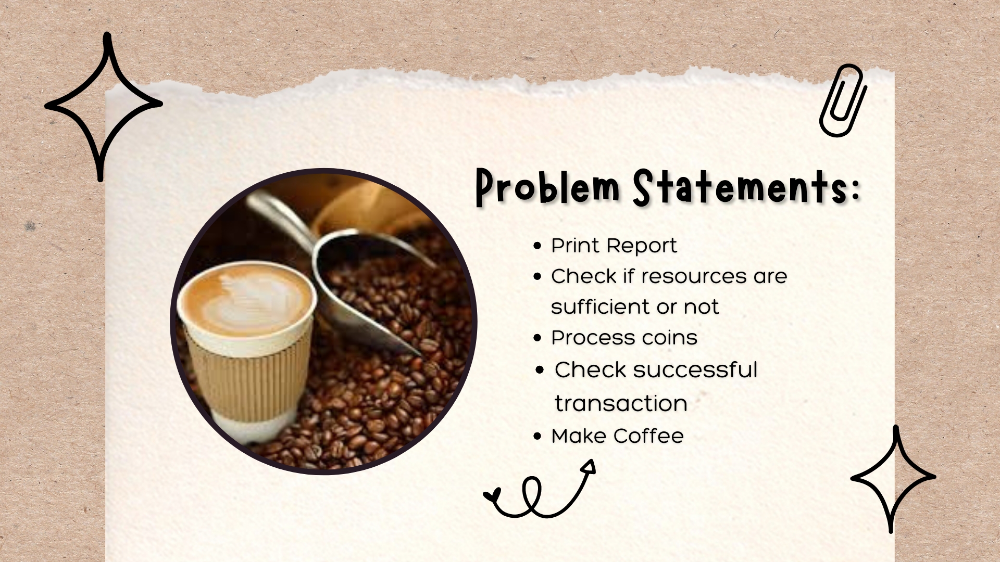

In [1]:
class MenuItem:
    """Models each Menu Item."""
    def __init__(self, name, water, milk, coffee, cost):
        self.name = name
        self.cost = cost
        self.ingredients = {
            "water": water,
            "milk": milk,
            "coffee": coffee
        }

In [2]:
class CoffeeMaker:
    """Models the machine that makes the coffee"""
    def __init__(self):
        self.resources = {
            "water": 300,
            "milk": 200,
            "coffee": 100,
        }

    def report(self):
        """Prints a report of all resources."""
        print("Water: {}ml".format(self.resources['water']))
        print("Milk: {}ml".format(self.resources['milk']))
        print("Coffee: {}g".format(self.resources['coffee']))

    def is_resource_sufficient(self, drink):
        """Returns True when order can be made, False if ingredients are insufficient."""
        can_make = True
        for item in drink.ingredients:
            if drink.ingredients[item] > self.resources[item]:
                print(f"Sorry there is not enough {item}.")
                can_make = False
        return can_make

    def make_coffee(self, order):
        """Deducts the required ingredients from the resources."""
        for item in order.ingredients:
            self.resources[item] -= order.ingredients[item]
        print(f'''
             )))
            (((
          +-----+
          |     |] - We are making your {order.name}. :)
          `-----'   Till then please have a sit and enjoy your quality time here!
        ''')

In [3]:
class Menu:
    """Models the Menu with drinks."""
    def __init__(self):
        self.menu = [
            MenuItem(name="latte", water=200, milk=150, coffee=24, cost=70),
            MenuItem(name="espresso", water=50, milk=0, coffee=18, cost=100),
            MenuItem(name="cappuccino", water=250, milk=50, coffee=24, cost=120),
        ]

    def get_items(self):
        """Returns all the names of the available menu items"""
        options = ""
        for item in self.menu:
            options += f"{item.name}/"
        return options

    def find_drink(self, order_name):
        """Searches the menu for a particular drink by name. Returns that item if it exists, otherwise returns None"""
        for item in self.menu:
            if item.name == order_name:
                return item
        print("Sorry that coffee is not available.")

In [4]:
class MoneyMachine:
    CURRENCY = "Rs."

    NOTES_VALUES = {
        "Hundreds": 100,
        "fifties": 50,
        "twenties": 20,
        "tens": 10
    }

    def __init__(self):
        self.profit = 0
        self.money_received = 0

    def report(self):
        """Prints the current profit"""
        print(f"Money: {self.CURRENCY}{self.profit}")

    def process_notes(self):
        """Returns the total calculated amount from rupees inserted."""
        print('''\033[31m
        We accept the following Notes:
        Hundred (Rs.100), Fifty (Rs.50)
        Twenty (Rs.20), Ten (Rs.10)\033[m
        ''')
        for note in self.NOTES_VALUES:
            self.money_received += int(input(f"How many {note}? Please: ")) * self.NOTES_VALUES[note]
        print(f'You have provided: {self.CURRENCY}{self.money_received}')
        return self.money_received

    def make_payment(self, cost):
        """Returns True when payment is accepted, or False if insufficient."""
        self.process_notes()
        if self.money_received >= cost:
            change = round(self.money_received - cost, 2)
            print(f"Here is {self.CURRENCY}{change} in change.")
            self.profit += cost
            self.money_received = 0
            return True
        else:
            print("Sorry that's not enough money. Money refunded.")
            self.money_received = 0
            return False

In [5]:
def welcome():
    print('''\033[31m
             )))
            (((
          +-----+
          |     |] - WELCOME TO THE CODER'S READY COFFEE MACHINE!
          `-----' 
    
          ------ MENU ------ 
          Espresso (Rs.100)
          Latte (Rs.70)
          Cappuccino (RS.120)
          ------------------
    
          PS: Type "report" at any moment
          to check our resources available.
          Type "off" to log out from the machine.\033[m
        ''')
            

# `Interface:`

In [6]:
menu = Menu()
money_machine = MoneyMachine()
coffee_maker = CoffeeMaker()
is_on = True

while is_on:
    welcome()
    options = menu.get_items()
    user_choice = str(input(f'hey! Which Coffee would you like to order?\nOptions ({options}): ')).strip().lower()
    if user_choice == 'off':
        print('\033[31m<<THE END>>\033[m')
        is_on = False
    elif user_choice == 'report':
        coffee_maker.report()
        money_machine.report()
    elif menu.find_drink(user_choice) is None:
        print('\033[31mError. Please choose an available option.\033[m')
    else:
        beverage = menu.find_drink(user_choice)  # Encapsulates the result
        sufficient_resources = coffee_maker.is_resource_sufficient(beverage)  # TrueFalse result
        sufficient_money = money_machine.make_payment(beverage.cost)
        if sufficient_resources and sufficient_money:
            print('Thank you! Allow us to make your beverage now...')
            coffee_maker.make_coffee(beverage)


             )))
            (((
          +-----+
          |     |] - WELCOME TO THE CODER'S READY COFFEE MACHINE!
          `-----' 
    
          ------ MENU ------ 
          Espresso (Rs.100)
          Latte (Rs.70)
          Cappuccino (RS.120)
          ------------------
    
          PS: Type "report" at any moment
          to check our resources available.
          Type "off" to log out from the machine.
        
hey! Which Coffee would you like to order?
Options (latte/espresso/cappuccino/): latte

        We accept the following Notes:
        Hundred (Rs.100), Fifty (Rs.50)
        Twenty (Rs.20), Ten (Rs.10)
        
How many Hundreds? Please: 1
How many fifties? Please: 0
How many twenties? Please: 0
How many tens? Please: 0
You have provided: Rs.100
Here is Rs.30 in change.
Thank you! Allow us to make your beverage now...

             )))
            (((
          +-----+
          |     |] - We are making your latte. :)
          `-----'   Till then please have 

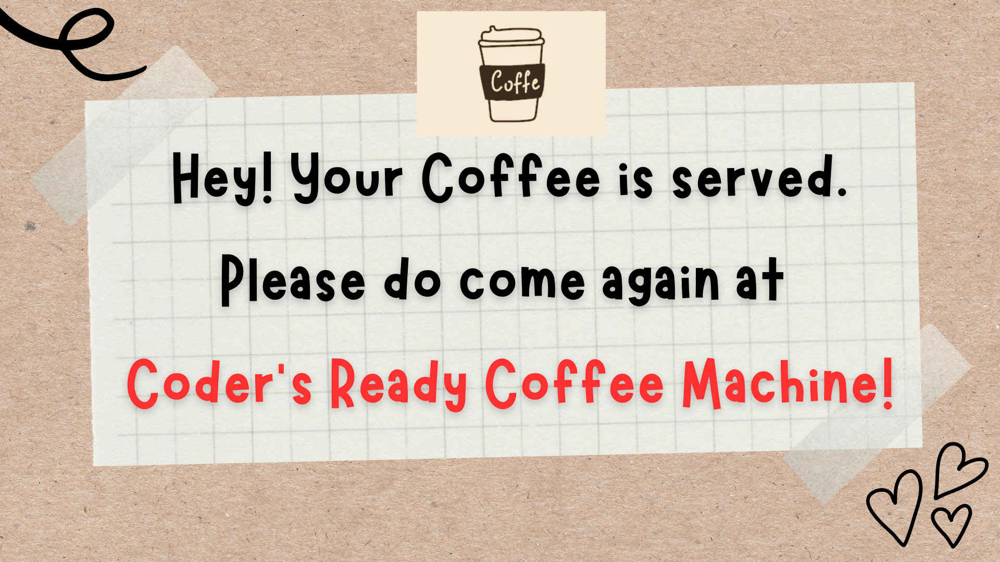